# SETUP

In [1]:
prompt_base="a robot dog in real world"
fn_prefix="robot-dog"
url="https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg"

# GO

## Helper functions

In [66]:
# helper functions
def thumb(img, height=600):
    f=height/img.size[1]     
    img = img.resize([int(x*f) for x in img.size])
    return img
    
def thumbs(imgs):
    return [thumb(img) for img in imgs]

def grid(images, labels, saveTo=None, fontsize=5, max_imgs_per_row=5):
    import numpy as np
    import matplotlib.pyplot as plt
    from math import ceil

    columns = min(len(images),max_imgs_per_row)
    rows = ceil(len(images)/max_imgs_per_row)

    fig = plt.figure(figsize=(6*columns, 5*rows))  # Width, height in inches.
    # fig = plt.figure(figsize=(3*columns, 3*rows))  # Width, height in inches.
    for x, (img, label) in enumerate(zip(images, labels)):
        ax = fig.add_subplot(rows, columns, x+1)
        ax.imshow(img, cmap='gray' if img.mode == 'L' else None)
        ax.set_title(label, fontsize=fontsize)  # Set the label as the title of the subplot
        ax.axis('off')  # Turn off the axis
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.tight_layout(pad=0.5)
    plt.show()

    if saveTo is not None:
        fig.savefig(saveTo, bbox_inches='tight', pad_inches=0.1)  

## Load pipeline

In [3]:
import torch
from diffusers import (
    T2IAdapter,
    StableDiffusionXLAdapterPipeline,
    DDPMScheduler,
    AutoencoderKL,
    EulerAncestralDiscreteScheduler
)
from diffusers.utils import load_image

model_id = "stabilityai/stable-diffusion-xl-base-1.0"

adapter = T2IAdapter.from_pretrained(
    "Adapter/t2iadapter", 
    subfolder="sketch_sdxl_1.0", 
    torch_dtype=torch.float16, 
    adapter_type="full_adapter_xl")

vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix", 
    torch_dtype=torch.float16)

euler_a = EulerAncestralDiscreteScheduler.from_pretrained(
    model_id, 
    subfolder="scheduler")

pipe = StableDiffusionXLAdapterPipeline.from_pretrained(
    model_id, 
    adapter=adapter, 
    vae=vae,
    scheduler=euler_a,
    torch_dtype=torch.float16, 
    variant="fp16", 
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## Load and preprocess input image

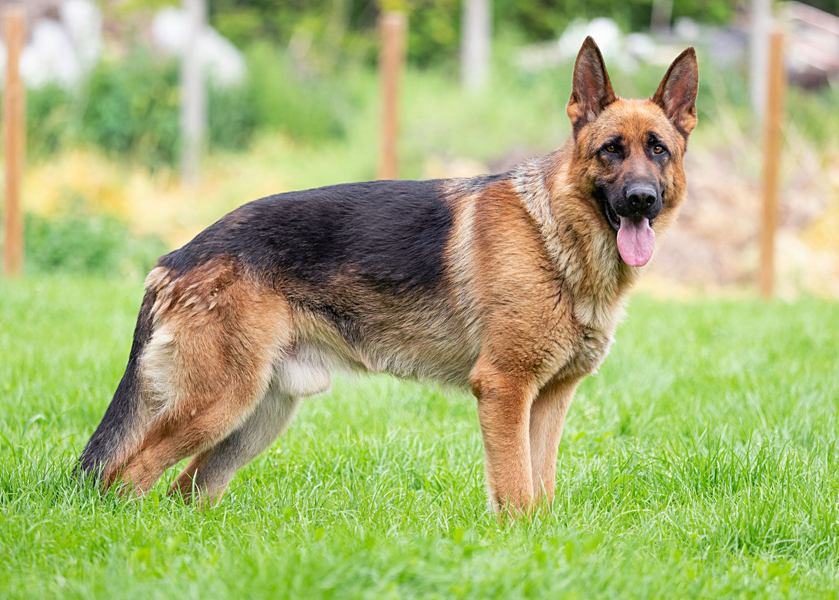

In [69]:
from PIL import Image
import io, requests

image_input = Image.open(io.BytesIO(requests.get(url, stream=True).content))
thumb(image_input).save(f"{fn_prefix}_input.png")
thumb(image_input)

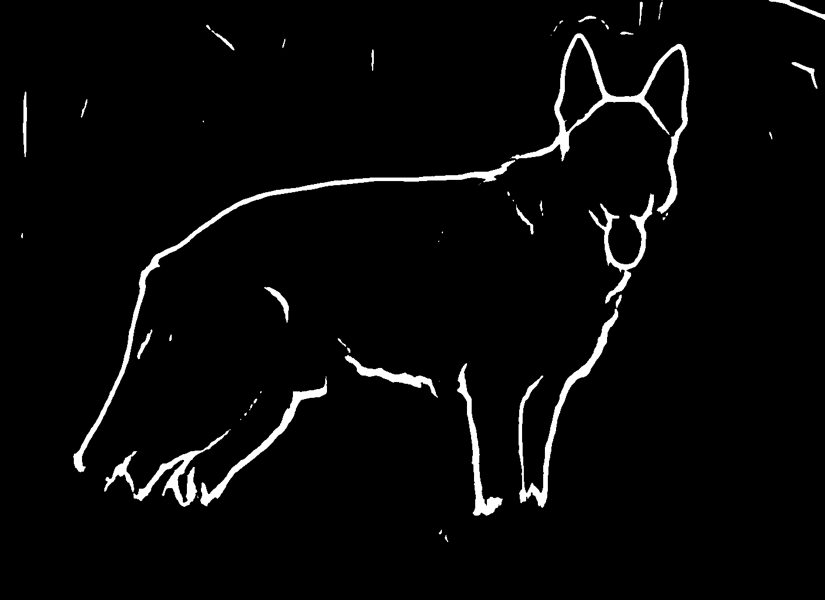

In [70]:
from controlnet_aux.pidi import PidiNetDetector

preprocessor = PidiNetDetector.from_pretrained("lllyasviel/Annotators").to("cuda")
image_preprocessed = preprocessor(image_input, detect_resolution=1024, image_resolution=1024,apply_filter=True).convert("L")

thumb(image_preprocessed)

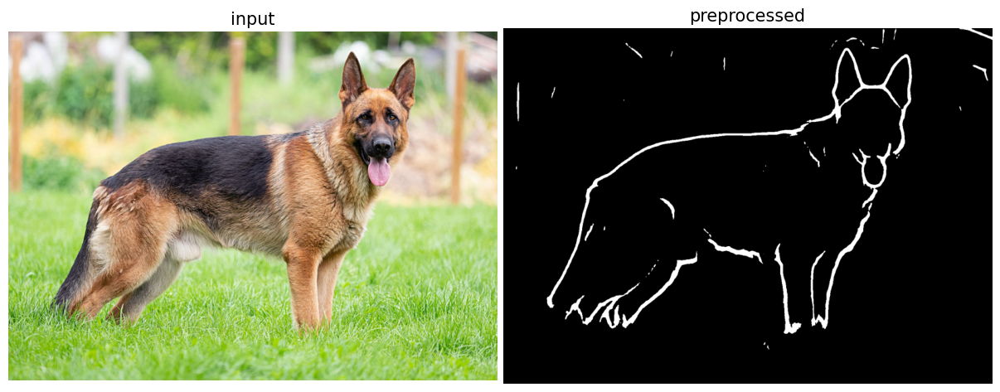

In [71]:
images = thumbs([image_input, image_preprocessed])
labels = ['input', 'preprocessed'] 
grid(images, labels, f"{fn_prefix}_proc-step.png", fontsize=15)

## More preprocessors

Loading base model ()...Done.
Removing last two layers (global_pool & classifier).
hed
midas
mlsd
pidi
normal_bae
lineart
lineart_anime
sam
leres


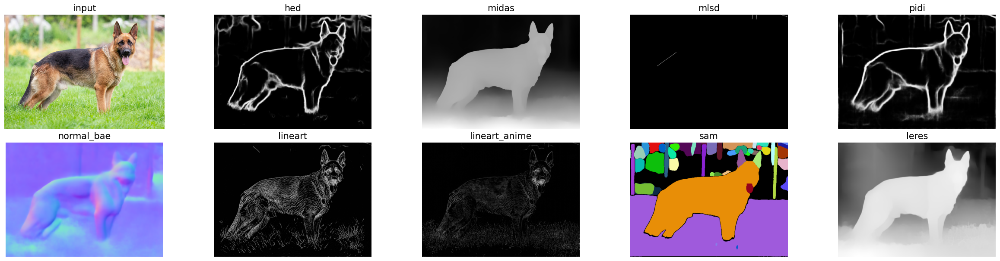

In [43]:
from controlnet_aux import HEDdetector, MidasDetector, MLSDdetector, OpenposeDetector, PidiNetDetector, NormalBaeDetector, LineartDetector, LineartAnimeDetector, CannyDetector, ContentShuffleDetector, ZoeDetector, MediapipeFaceDetector, SamDetector, LeresDetector, DWposeDetector

pp = [
    ["hed", HEDdetector.from_pretrained("lllyasviel/Annotators")],
    ["midas", MidasDetector.from_pretrained("lllyasviel/Annotators")],
    ["mlsd", MLSDdetector.from_pretrained("lllyasviel/Annotators")],
    ["pidi", PidiNetDetector.from_pretrained("lllyasviel/Annotators")],
    ["normal_bae", NormalBaeDetector.from_pretrained("lllyasviel/Annotators")],
    ["lineart", LineartDetector.from_pretrained("lllyasviel/Annotators")],
    ["lineart_anime", LineartAnimeDetector.from_pretrained("lllyasviel/Annotators")],
    ["sam", SamDetector.from_pretrained("ybelkada/segment-anything", subfolder="checkpoints")],
    ["leres", LeresDetector.from_pretrained("lllyasviel/Annotators")],
]

labels_pp=[n for n,_ in pp]
images_pp=[]
for preprocessor, fn in pp:
    print(preprocessor)
    image_preprocessed = fn(image_input)
    images_pp.append(image_preprocessed)

images = thumbs([image_input]+images_pp)
labels = ['input'] + labels_pp 
grid(images, labels, f"{fn_prefix}_preprocessors.png", fontsize=15)

## Diffuse

  0%|          | 0/40 [00:00<?, ?it/s]

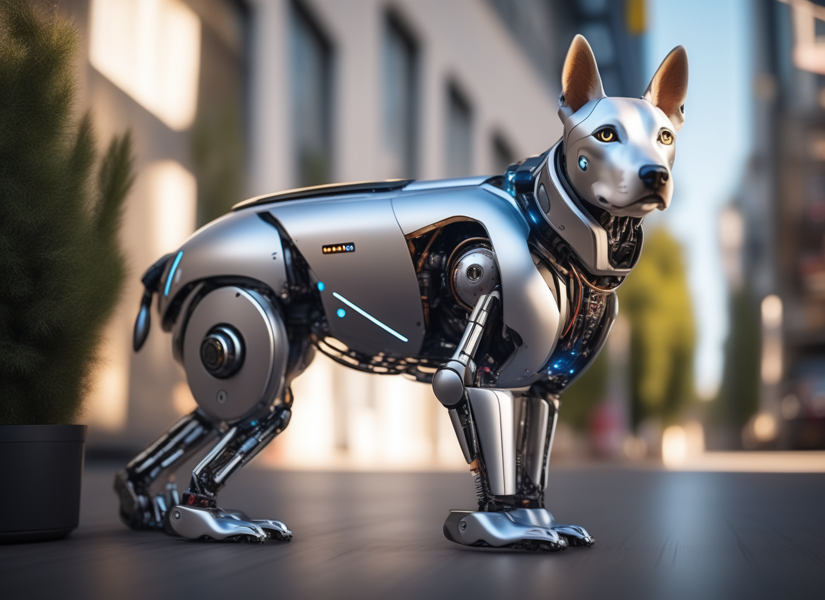

In [7]:
prompt = f"{prompt_base}, 4k photo, highly detailed"

image = pipe(
        prompt=prompt,
        negative_prompt=f"disfigured, extra digit, fewer digits, cropped, worst quality, low quality",
        image=image_preprocessed,
        guidance_scale=7.5,
        num_inference_steps=40,
        adapter_conditioning_scale=0.9,
        adapter_conditioning_factor=0.9,
        generator = torch.manual_seed(42),
    ).images[0]
thumb(image).save(f"{fn_prefix}_diffused.png")
thumb(image)

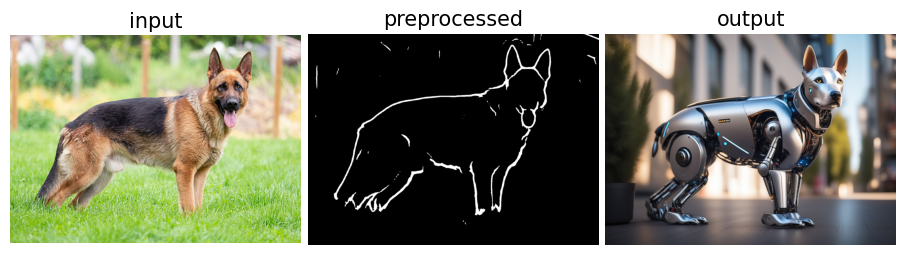

In [8]:
images = thumbs([image_input, image_preprocessed, image])
labels = ['input', 'preprocessed', 'output'] 
grid(images, labels, f"{fn_prefix}_overview.png", fontsize=15)

# num_inference_steps sweep

In [9]:
prompt = f"{prompt_base}, 4k photo, highly detailed"

images=[]
for num_steps in range(5, 45, 5):
    images.append( pipe(
            prompt=prompt,
            negative_prompt=f"disfigured, extra digit, fewer digits, cropped, worst quality, low quality",
            image=image_preprocessed,
            guidance_scale=7.5,
            num_inference_steps=num_steps,
            adapter_conditioning_scale=0.9,
            adapter_conditioning_factor=0.9,
            generator = torch.manual_seed(42),
        ).images[0] )

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

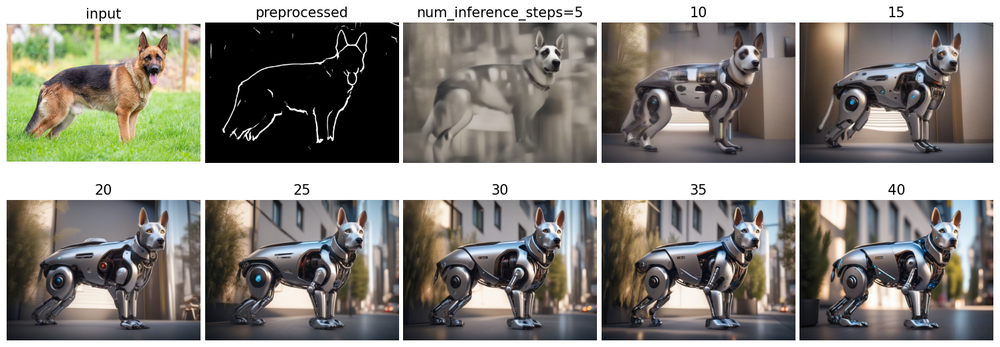

In [10]:
images_gall=thumbs([image_input, image_preprocessed]+images)
labels_gall = ['input', 'preprocessed'] + [f"num_inference_steps={s}" if i==0 else s for i,s in enumerate(range(5, 45, 5))] 
grid(images_gall, labels_gall, f"{fn_prefix}_sweep-steps.png", fontsize=15)

# guidance_scale sweep

In [11]:
prompt = f"{prompt_base}, 4k photo, highly detailed"

images=[]
for guidance_scale in range(0, 16):
    images.append( pipe(
            prompt=prompt,
            negative_prompt=f"disfigured, extra digit, fewer digits, cropped, worst quality, low quality",
            image=image_preprocessed,
            guidance_scale=guidance_scale,
            num_inference_steps=25,
            adapter_conditioning_scale=0.9,
            adapter_conditioning_factor=0.9,
            generator = torch.manual_seed(42),
        ).images[0] )

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

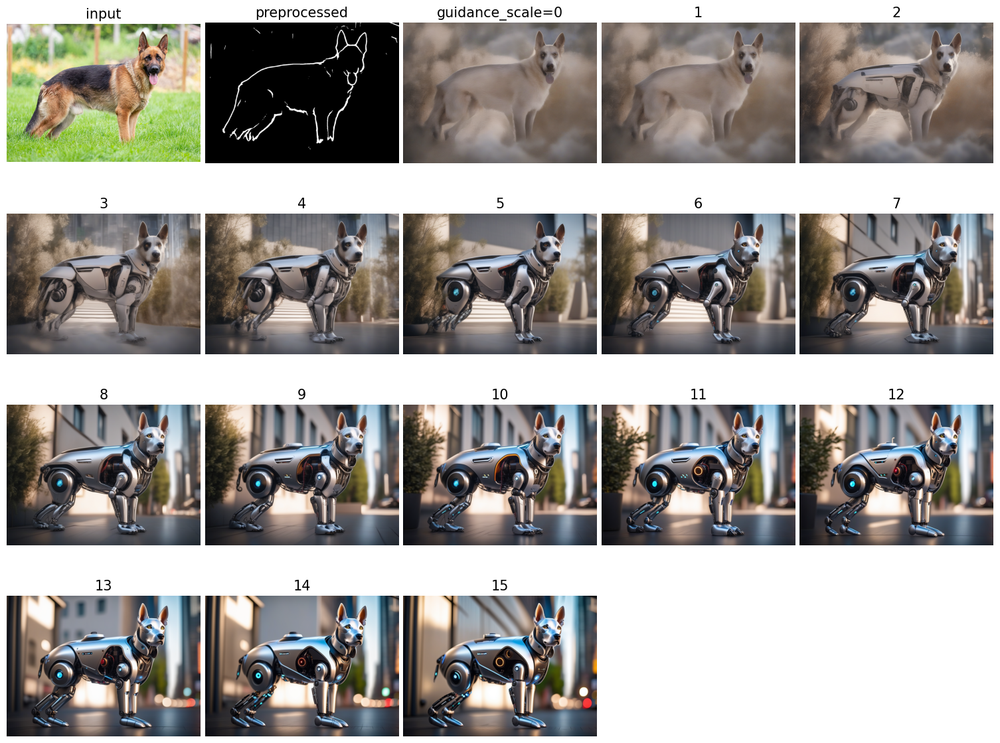

In [12]:
images_gall=thumbs([image_input, image_preprocessed]+images)

images_gall=thumbs([image_input, image_preprocessed]+images)
labels_gall = ['input', 'preprocessed'] + [f"guidance_scale={s}" if i==0 else s for i,s in enumerate(range(0,16))] 
grid(images_gall, labels_gall, f"{fn_prefix}_sweep-guidance_scale.png", fontsize=15)

## generic prompt

  0%|          | 0/40 [00:00<?, ?it/s]

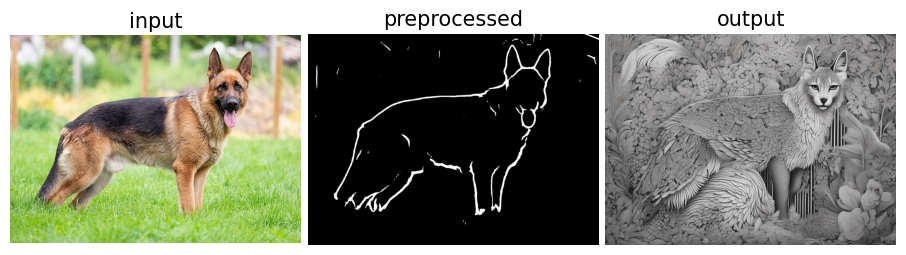

In [13]:
prompt = "highly detailed"

image = pipe(
        prompt=prompt,
        negative_prompt=f"disfigured, extra digit, fewer digits, cropped, worst quality, low quality",
        image=image_preprocessed,
        guidance_scale=7.5,
        num_inference_steps=40,
        adapter_conditioning_scale=0.9,
        adapter_conditioning_factor=0.9,
        generator = torch.manual_seed(42),
    ).images[0]
thumb(image).save(f"{fn_prefix}_gen-prompt_diffused.png")

images = thumbs([image_input, image_preprocessed, image])
labels = ['input', 'preprocessed', 'output'] 
grid(images, labels, f"{fn_prefix}_gen-prompt_overview.png", fontsize=15)

# adapter_conditioning_scale sweep

In [14]:
prompt = f"{prompt_base}, 4k photo, highly detailed"

images=[]
for adapter_conditioning_scale in list(range(0,101,10)):
    images.append( pipe(
            prompt=prompt,
            negative_prompt=f"disfigured, extra digit, fewer digits, cropped, worst quality, low quality",
            image=image_preprocessed,
            guidance_scale=7.5,
            num_inference_steps=25,
            adapter_conditioning_scale=adapter_conditioning_scale/100,
            adapter_conditioning_factor=0.9,
            generator = torch.manual_seed(42),
        ).images[0] )

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

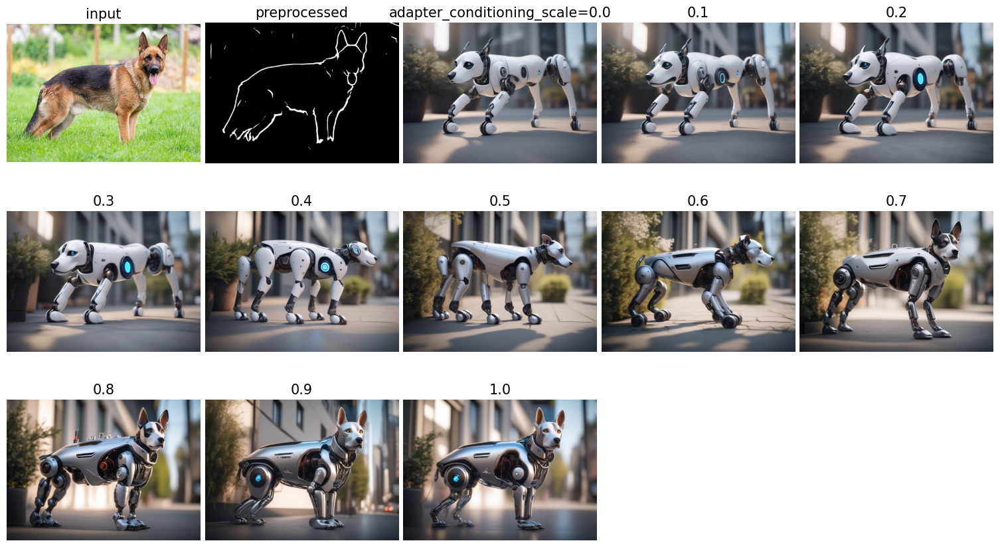

In [15]:
images_gall=thumbs([image_input, image_preprocessed]+images)
labels_gall = ['input', 'preprocessed'] + [f"adapter_conditioning_scale={s/100}" if i==0 else f"{s/100}" for i,s in enumerate(range(0,101,10))] 
grid(images_gall, labels_gall, f"{fn_prefix}-sweep-adapter_conditioning_scale.png", fontsize=15)

# adapter_conditioning_factor sweep

In [16]:
prompt = f"{prompt_base}, 4k photo, highly detailed"

images=[]
for adapter_conditioning_factor in list(range(0,101,10)):
    images.append( pipe(
            prompt=prompt,
            negative_prompt=f"disfigured, extra digit, fewer digits, cropped, worst quality, low quality",
            image=image_preprocessed,
            guidance_scale=7.5,
            num_inference_steps=25,
            adapter_conditioning_scale=0.9,
            adapter_conditioning_factor=adapter_conditioning_factor/100,
            generator = torch.manual_seed(42),
        ).images[0] )

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

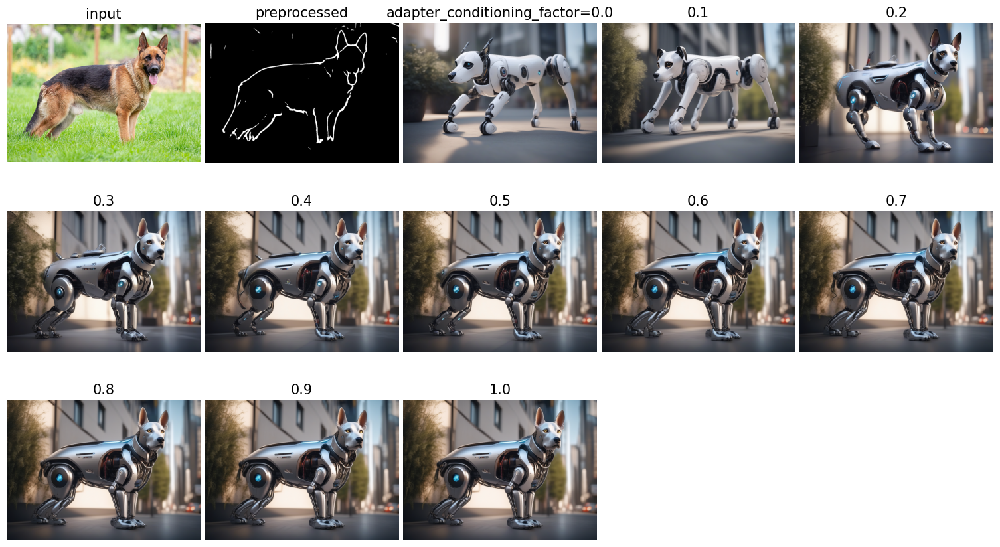

In [17]:
images_gall=thumbs([image_input, image_preprocessed]+images)
labels_gall = ['input', 'preprocessed'] + [f"adapter_conditioning_factor={s/100}" if i==0 else f"{s/100}" for i,s in enumerate(range(0,101,10))] 
grid(images_gall, labels_gall, f"{fn_prefix}-sweep-adapter_conditioning_factor.png", fontsize=15)

## combination sweep

In [20]:
prompt = f"{prompt_base}, 4k photo, highly detailed"

combis=[]
for s in [0.0, 0.25, 0.5, 0.75, 1.0]:
    for f in [0.0, 0.25, 0.5, 0.75, 1.0]:
        combis.append([s,f])

images=[]
for adapter_conditioning_scale,adapter_conditioning_factor in combis:
    images.append( pipe(
            prompt=prompt,
            negative_prompt=f"disfigured, extra digit, fewer digits, cropped, worst quality, low quality",
            image=image_preprocessed,
            guidance_scale=7.5,
            num_inference_steps=30,
            adapter_conditioning_scale=adapter_conditioning_scale,
            adapter_conditioning_factor=adapter_conditioning_factor,
            generator = torch.manual_seed(42),
        ).images[0] )

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

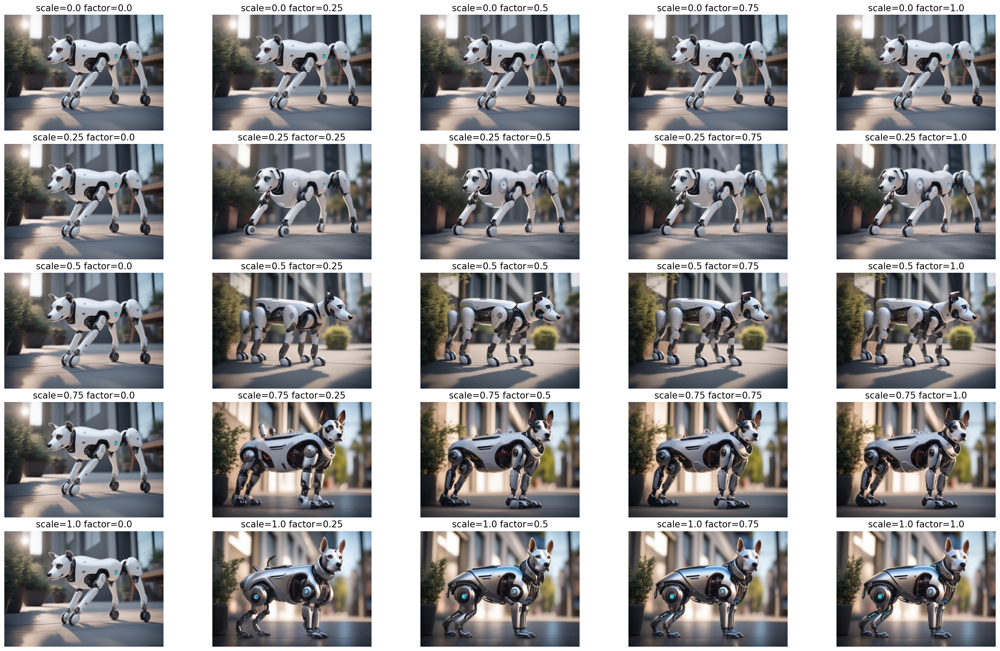

In [21]:
def grid(images, labels, saveTo=None, fontsize=5):
    import numpy as np
    import matplotlib.pyplot as plt
    from math import ceil

    max_imgs_per_row=5
    columns = min(len(images),max_imgs_per_row)
    rows = ceil(len(images)/max_imgs_per_row)

    fig = plt.figure(figsize=(5*columns, 3*rows))  # Width, height in inches.
    for x, (img, label) in enumerate(zip(images, labels)):
        ax = fig.add_subplot(rows, columns, x+1)
        ax.imshow(img, cmap='gray' if img.mode == 'L' else None)
        ax.set_title(label, fontsize=fontsize)  # Set the label as the title of the subplot
        ax.axis('off')  # Turn off the axis
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.tight_layout(pad=0.5)
    plt.show()

    if saveTo is not None:
        fig.savefig(saveTo, bbox_inches='tight', pad_inches=0.1)  

images_gall=thumbs(images)
labels_gall = [f"scale={s} factor={f}" for s,f in combis] 
grid(images_gall, labels_gall, f"{fn_prefix}-sweep-scale-and-factor.png", fontsize=15)